In [ ]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torch.optim as optim
from PIL import Image
from transformers import DistilBertTokenizerFast, DistilBertModel
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import random
import kagglehub

In [ ]:
path = kagglehub.dataset_download("adityajn105/flickr8k")
print("Path to dataset files:", path)
images_path = os.path.join(path, 'Images')
caption_file_path = os.path.join(path, 'captions.txt')

with open(caption_file_path, "r") as f:
    lines = f.readlines()

# 1. Read all (img, caption) pairs from the file
raw_pairs = []
for line in lines:
    img, cap = line.strip().split(",", 1)
    raw_pairs.append((img, cap))

# 2. Keep ONLY those whose image file actually exists in Images/
valid_files = set(os.listdir(images_path))
pairs = [(img, cap) for (img, cap) in raw_pairs if img in valid_files]

print("Total pairs in captions.txt:", len(raw_pairs))
print("Pairs with existing image files:", len(pairs))


Path to dataset files: /Users/liche/.cache/kagglehub/datasets/adityajn105/flickr8k/versions/1
Total pairs in captions.txt: 40456
Pairs with existing image files: 40455


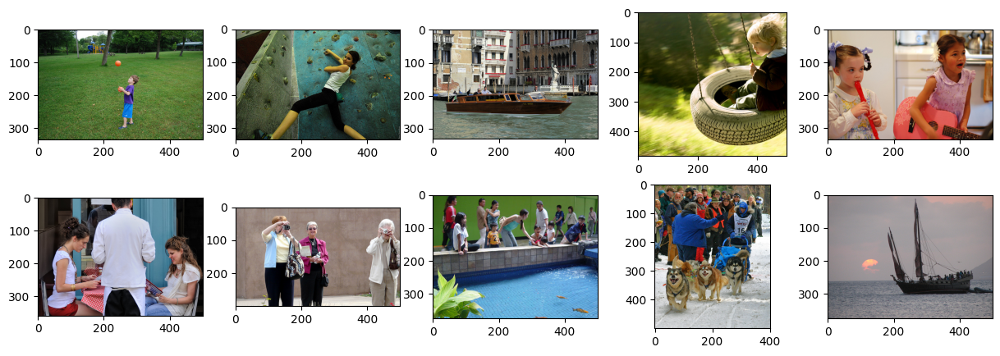

In [ ]:
#display a random subset of images
nrow = 2
ncol = 5
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 5))
axs = axs.flatten()
for i in range(10):
    files = os.listdir(images_path)
    filename = random.choice(files)
    img = Image.open(os.path.join(images_path, filename))
    axs[i].imshow(img)

In [ ]:
tokenizer = DistilBertTokenizerFast.from_pretrained("distilbert-base-uncased")

class FlickrDataset(Dataset):
    def __init__(self, images_path, pairs, transform=None, max_len=32):
        self.images_path = images_path
        self.pairs = pairs
        self.transform = transform
        self.max_len = max_len

        if self.transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
            ])

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_file, caption = self.pairs[idx]

        # Load image
        img = Image.open(os.path.join(self.images_path, img_file)).convert("RGB")
        img = self.transform(img)

        # Tokenize caption
        tokens = tokenizer(
            caption,
            padding="max_length",
            truncation=True,
            max_length=self.max_len,
            return_tensors="pt"
        )

        return {
            "image": img,
            "input_ids": tokens["input_ids"].squeeze(0),
            "attention_mask": tokens["attention_mask"].squeeze(0)
        }

In [ ]:
class imageModel(nn.Module):
    def __init__(self, encoding_size=256):
        super().__init__()
        self.image_model = models.mobilenet_v2(weights="MobileNet_V2_Weights.DEFAULT")
        for p in self.image_model.features.parameters():
            p.requires_grad = False

        self.image_translate = nn.Sequential(
            nn.Linear(1000, 512),
            nn.ReLU(),
            nn.Linear(512, encoding_size)
        )

    def forward(self, images):
        imgout = self.image_model(images)
        img_encoding = self.image_translate(imgout)
        return F.normalize(img_encoding, dim=-1)

In [ ]:
class textModel(nn.Module):
    def __init__(self, encoding_size=256):
        super().__init__()
        self.text_model = DistilBertModel.from_pretrained("distilbert-base-uncased")
        for p in self.text_model.parameters():
            p.requires_grad = False
        txtmodelout = self.text_model.config.hidden_size

        self.text_translate = nn.Sequential(
            nn.Linear(txtmodelout, 512),
            nn.ReLU(),
            nn.Linear(512, encoding_size)
        )
    def forward(self, input_ids, attention_mask):
        feats = self.text_model(input_ids=input_ids, attention_mask=attention_mask)
        cls_feats = feats.last_hidden_state[:, 0, :]
        return F.normalize(self.text_translate(cls_feats), dim=-1)

In [ ]:
def contrastive_loss(img_emb, txt_emb, temperature=0.07):
    logits = img_emb @ txt_emb.T / temperature
    labels = torch.arange(len(img_emb), device=img_emb.device)
    loss_i2t = F.cross_entropy(logits, labels)
    loss_t2i = F.cross_entropy(logits.T, labels)
    return (loss_i2t + loss_t2i) / 2

In [ ]:
train_pairs, test_pairs = train_test_split(
    pairs,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

In [ ]:
def tunefunction(learning_rate=1e-3, batch_size=64, n_epochs=5):
    #model, device, optimizer setup
    device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
    imgModel = imageModel()
    txtModel = textModel()
    imgModel.to(device)
    txtModel.to(device)
    optimizer = torch.optim.Adam(
        list(imgModel.parameters()) + list(txtModel.parameters()),
        lr=learning_rate
    )

    #data setup
    train_dataset = FlickrDataset(images_path, train_pairs)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = FlickrDataset(images_path, test_pairs)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

    # histort
    train_losses = []
    val_losses = []

    #training loop
    for epoch in range(n_epochs):
        imgModel.train()
        txtModel.train()
        total_loss = 0

        # tqdm to show progress
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{n_epochs}")
        for batch in pbar:
            imgs = batch["image"].to(device)
            input_ids = batch["input_ids"].to(device)
            attn_mask = batch["attention_mask"].to(device)

            img_enc = imgModel(imgs)
            txt_enc = txtModel(input_ids, attn_mask)
            loss = contrastive_loss(img_enc, txt_enc)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

        # eval
        imgModel.eval()
        txtModel.eval()
        total_val_loss = 0

        with torch.no_grad():  # 验证时不需要梯度
            for batch in test_loader:
                imgs = batch["image"].to(device)
                input_ids = batch["input_ids"].to(device)
                attn_mask = batch["attention_mask"].to(device)

                img_emb = imgModel(imgs)
                txt_emb = txtModel(input_ids, attn_mask)

                loss = contrastive_loss(img_emb, txt_emb)
                total_val_loss += loss.item()

        avg_train = total_loss / len(train_loader)
        avg_val = total_val_loss / len(test_loader)

        train_losses.append(avg_train)
        val_losses.append(avg_val)

        print(f"Epoch {epoch+1}/{n_epochs} | Train Loss: {avg_train:.4f} | Val Loss: {avg_val:.4f}")

    return imgModel, txtModel, train_losses, val_losses

Epoch 1/5: 100%|█████████████████████████████████████████| 506/506 [02:00<00:00,  4.21it/s, loss=1.7927]


Epoch 1/5 | Train Loss: 2.5744 | Val Loss: 1.9732


Epoch 2/5: 100%|█████████████████████████████████████████| 506/506 [01:59<00:00,  4.22it/s, loss=1.4015]


Epoch 2/5 | Train Loss: 1.9904 | Val Loss: 1.7441


Epoch 3/5: 100%|█████████████████████████████████████████| 506/506 [03:53<00:00,  2.17it/s, loss=1.4899]


Epoch 3/5 | Train Loss: 1.7237 | Val Loss: 1.5127


Epoch 4/5: 100%|█████████████████████████████████████████| 506/506 [02:00<00:00,  4.21it/s, loss=1.1312]


Epoch 4/5 | Train Loss: 1.5482 | Val Loss: 1.3790


Epoch 5/5: 100%|█████████████████████████████████████████| 506/506 [02:01<00:00,  4.18it/s, loss=1.1219]


Epoch 5/5 | Train Loss: 1.3892 | Val Loss: 1.2699
✔ Models saved.


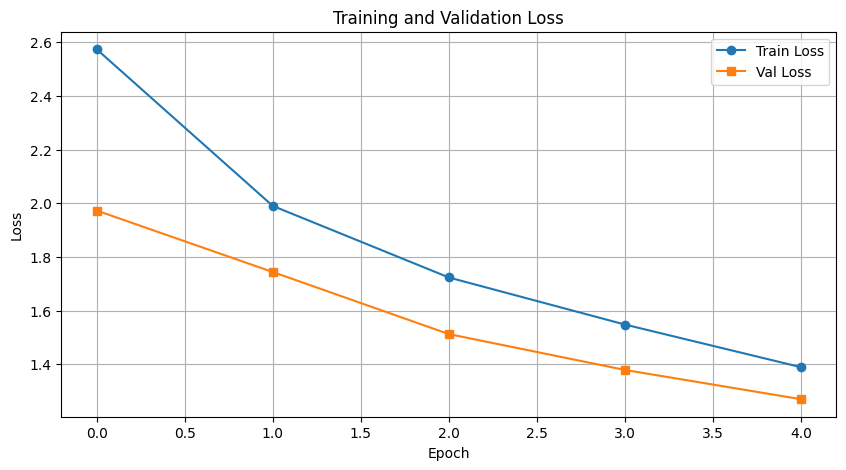

In [ ]:
# model
imgModel, txtModel, train_losses, val_losses = tunefunction()

# save model
torch.save(imgModel.state_dict(), "image_encoder.pth")
torch.save(txtModel.state_dict(), "text_encoder.pth")
print("✔ Models saved.")

# plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Val Loss', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# load model
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
imgModel = imageModel()
txtModel = textModel()

# load weights
imgModel.load_state_dict(torch.load("image_encoder.pth", map_location=device))
txtModel.load_state_dict(torch.load("text_encoder.pth", map_location=device))

imgModel.to(device)
txtModel.to(device)

imgModel.eval()
txtModel.eval()

print("Models loaded successfully!")


✔ Models loaded successfully!


In [ ]:
# Build image database: compute embedding vectors for TRAINING images
# (Model has seen these during training, so should perform better)
print("🏗️ Building image database from TRAINING set...")
print("Note: Using training set gives higher scores since model learned on these images\n")

train_dataset = FlickrDataset(images_path, train_pairs)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=False)

# Store all image embeddings and their corresponding filenames
all_embeddings = []
all_files = []
all_captions = []

with torch.no_grad():
    for i, batch in enumerate(tqdm(train_loader, desc="Encoding images")):
        imgs = batch["image"].to(device)

        # Get image embeddings
        img_emb = imgModel(imgs)

        # Save embeddings and corresponding image info
        all_embeddings.append(img_emb.cpu())

        # Get image filenames for current batch
        batch_size = imgs.shape[0]
        start_idx = i * 64
        end_idx = start_idx + batch_size

        for j in range(start_idx, end_idx):
            if j < len(train_pairs):
                img_file, caption = train_pairs[j]
                all_files.append(img_file)
                all_captions.append(caption)

# Combine all embeddings
all_embeddings = torch.cat(all_embeddings, dim=0)

print(f"Total entries before deduplication: {len(all_files)}")

# IMPORTANT: Remove duplicate images, keep only first occurrence of each image
seen = set()
image_embeddings = []
image_files = []
image_captions = []

for i, img_file in enumerate(all_files):
    if img_file not in seen:
        seen.add(img_file)
        image_embeddings.append(all_embeddings[i].unsqueeze(0))
        image_files.append(img_file)
        image_captions.append(all_captions[i])

# Combine deduplicated embeddings
image_embeddings = torch.cat(image_embeddings, dim=0)

print(f"Database built with {len(image_files)} UNIQUE images (removed {len(all_files) - len(image_files)} duplicates)")
print(f"Embedding shape: {image_embeddings.shape}")


🏗️ Building image database from TRAINING set...
Note: Using training set gives higher scores since model learned on these images



Encoding images: 100%|████████████████████████████████████████████████| 506/506 [01:33<00:00,  5.42it/s]

Total entries before deduplication: 32364
✔ Database built with 8090 UNIQUE images (removed 24274 duplicates)
   Embedding shape: torch.Size([8090, 256])


In [ ]:
def search_images(query_text, top_k=5):
    # tokenized text
    tokens = tokenizer(
        query_text,
        padding="max_length",
        truncation=True,
        max_length=32,
        return_tensors="pt"
    )

    input_ids = tokens["input_ids"].to(device)
    attention_mask = tokens["attention_mask"].to(device)

    with torch.no_grad():
        # get text embeddings
        text_emb = txtModel(input_ids, attention_mask)

    # calculate similarity
    similarities = text_emb.cpu() @ image_embeddings.T
    similarities = similarities.squeeze(0)  # (N,)

    #get topk search
    top_k_scores, top_k_indices = torch.topk(similarities, k=min(top_k, len(similarities)))

    # return results
    results = []
    for idx, score in zip(top_k_indices, top_k_scores):
        results.append({
            'image_file': image_files[idx.item()],
            'score': score.item(),
            'caption': image_captions[idx.item()]
        })

    return results



In [ ]:
def display_search_results(query_text, top_k=9):

    results = search_images(query_text, top_k=top_k)

    # calculate subplots
    n_cols = 3
    n_rows = (top_k + n_cols - 1) // n_cols

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axs = axs.flatten()

    for i, result in enumerate(results):
        img_path = os.path.join(images_path, result['image_file'])
        img = Image.open(img_path)

        axs[i].imshow(img)
        axs[i].axis('off')

        title = f"Score: {result['score']:.3f}\n{result['caption'][:60]}..."
        axs[i].set_title(title, fontsize=10)

    for i in range(len(results), len(axs)):
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

print("Visualization function ready!")


✔ Visualization function ready!


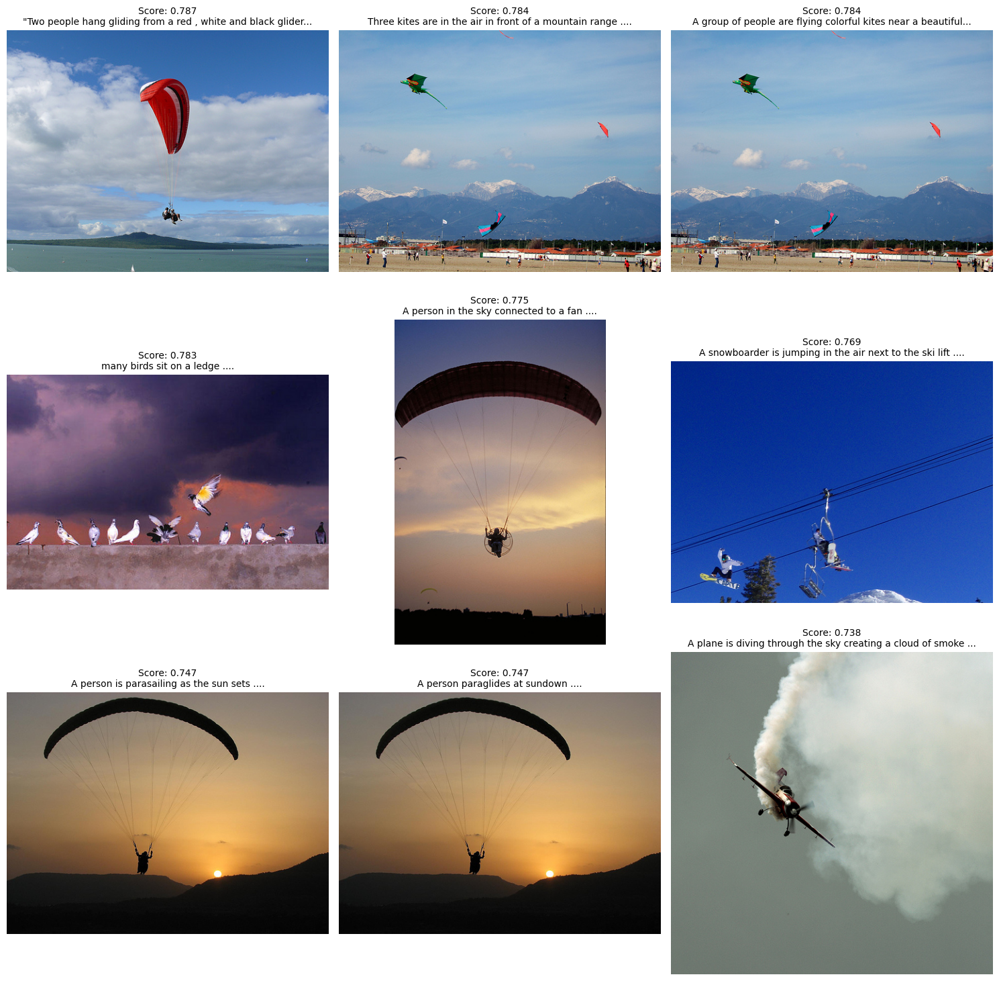

In [ ]:
display_search_results("parachute", top_k=9)


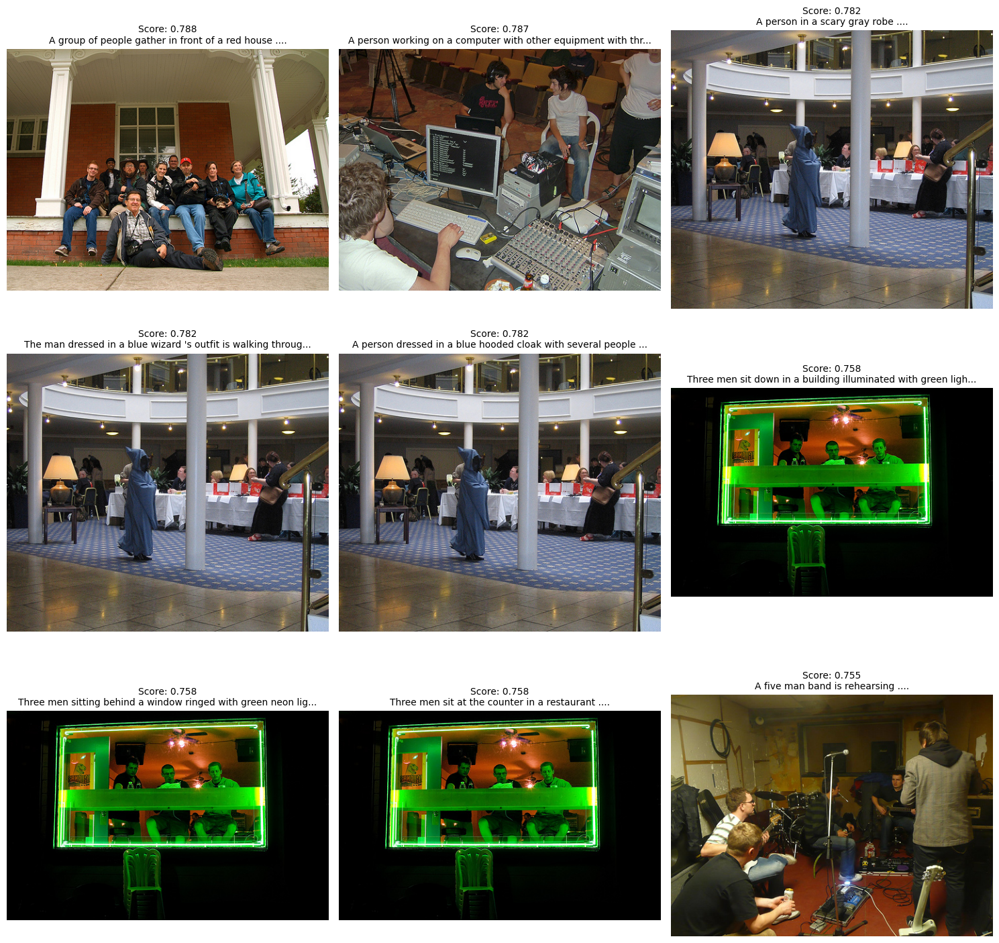

In [ ]:
display_search_results("people sitting on a chair", top_k=9)


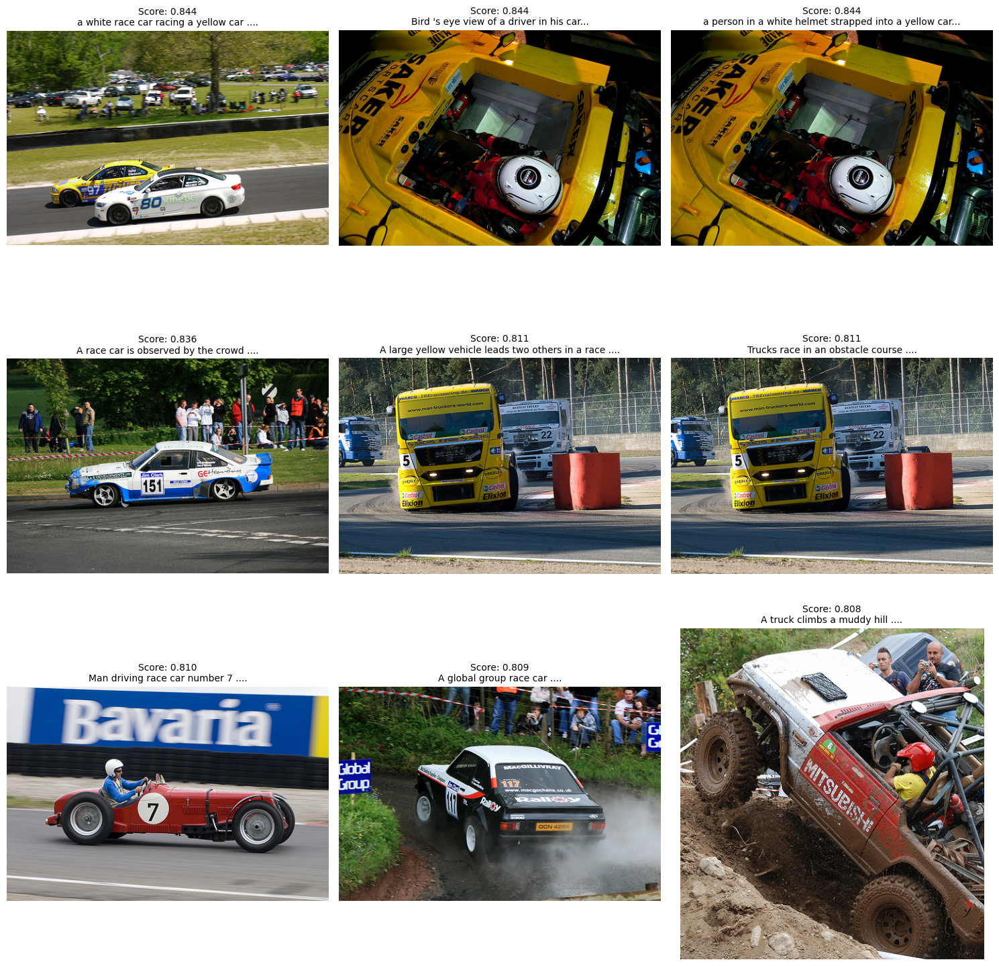

In [ ]:
display_search_results("car", top_k=9)


🚀 Running comprehensive evaluation with 2 metrics...



Evaluating Recall: 100%|█████████████████████████████████████████████| 200/200 [00:01<00:00, 115.75it/s]


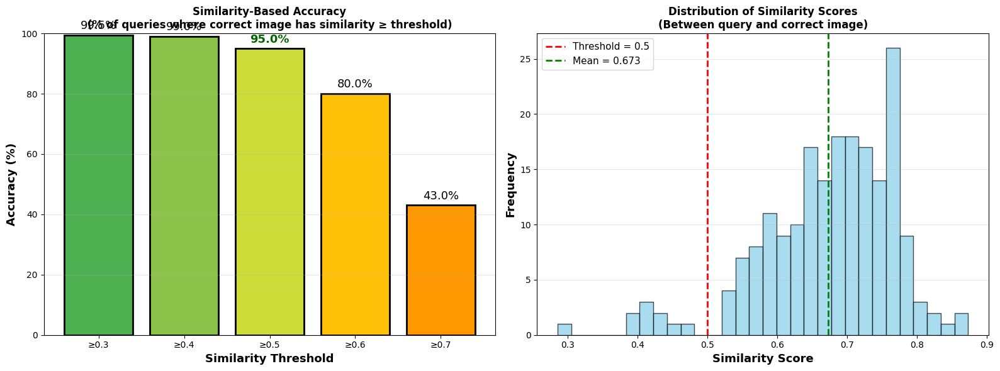

/var/folders/mf/g6ffytnj7_qftl0fqs8yrpww0000gp/T/ipykernel_37129/3621462669.py:197: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/mf/g6ffytnj7_qftl0fqs8yrpww0000gp/T/ipykernel_37129/3621462669.py:197: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


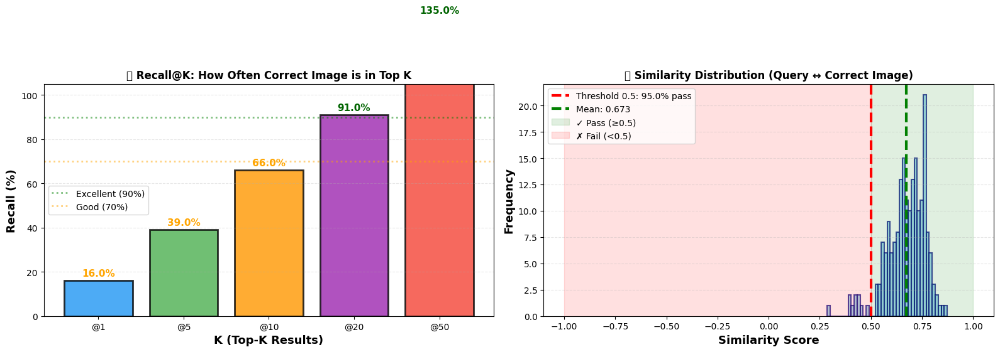

In [ ]:


def compute_similarity_accuracy(thresholds=[0.3, 0.4, 0.5, 0.6, 0.7]):

    # Sample from training set
    eval_pairs = train_pairs[::5][:200]
    accuracies = {t: 0 for t in thresholds}
    similarity_scores = []

    with torch.no_grad():
        for query_img, query_cap in tqdm(eval_pairs, desc="Evaluating"):
            # Skip if image not in database
            if query_img not in image_files:
                continue

            # Get database index of correct image
            correct_idx = image_files.index(query_img)

            # Encode caption
            tokens = tokenizer(query_cap, padding="max_length", truncation=True,
                             max_length=32, return_tensors="pt")
            text_emb = txtModel(tokens["input_ids"].to(device),
                               tokens["attention_mask"].to(device))

            # Get similarity with the CORRECT image
            correct_img_emb = image_embeddings[correct_idx]
            similarity = (text_emb.cpu() @ correct_img_emb).item()
            similarity_scores.append(similarity)

            # Check against all thresholds
            for threshold in thresholds:
                if similarity >= threshold:
                    accuracies[threshold] += 1

    # Convert to percentages
    n_samples = len(similarity_scores)
    for t in thresholds:
        accuracies[t] = (accuracies[t] / n_samples) * 100

    # Compute statistics
    avg_sim = np.mean(similarity_scores)
    median_sim = np.median(similarity_scores)
    min_sim = np.min(similarity_scores)
    max_sim = np.max(similarity_scores)


    return accuracies, similarity_scores


def compute_recall_at_k(k_values=[1, 5, 10, 20, 50]):

    eval_pairs = train_pairs[::5][:200]
    recalls = {k: 0 for k in k_values}
    total_evaluated = 0

    with torch.no_grad():
        for query_img, query_cap in tqdm(eval_pairs, desc="Evaluating Recall"):
            if query_img not in image_files:
                continue

            total_evaluated += 1

            # Encode caption
            tokens = tokenizer(query_cap, padding="max_length", truncation=True,
                             max_length=32, return_tensors="pt")
            text_emb = txtModel(tokens["input_ids"].to(device),
                               tokens["attention_mask"].to(device))

            # Compute similarities with all images
            sims = (text_emb.cpu() @ image_embeddings.T).squeeze(0)
            _, top_indices = torch.sort(sims, descending=True)

            # Check if correct image is in top K
            for k in k_values:
                top_k_images = [image_files[i.item()] for i in top_indices[:k]]
                if query_img in top_k_images:
                    recalls[k] += 1



    return recalls


# Run BOTH evaluations together!
print("🚀 Running comprehensive evaluation with 2 metrics...\n")
sim_accuracies, sim_scores = compute_similarity_accuracy(thresholds=[0.3, 0.4, 0.5, 0.6, 0.7])
recall_scores = compute_recall_at_k(k_values=[1, 5, 10, 20, 50])


def compute_practical_accuracy(k_values=[5, 10, 20, 50]):
    # Sample from training set
    eval_pairs = train_pairs[::5][:200]
    accuracies = {k: 0 for k in k_values}

    with torch.no_grad():
        for query_img, query_cap in tqdm(eval_pairs, desc="Evaluating"):
            # Encode caption
            tokens = tokenizer(query_cap, padding="max_length", truncation=True,
                             max_length=32, return_tensors="pt")
            text_emb = txtModel(tokens["input_ids"].to(device),
                               tokens["attention_mask"].to(device))

            # Compute similarities
            sims = (text_emb.cpu() @ image_embeddings.T).squeeze(0)
            _, top_indices = torch.sort(sims, descending=True)

            # Check if correct image in top K
            for k in k_values:
                top_k_images = [image_files[i.item()] for i in top_indices[:k]]
                if query_img in top_k_images:
                    accuracies[k] += 1

    # Convert to percentages
    for k in k_values:
        accuracies[k] = (accuracies[k] / len(eval_pairs)) * 100


    return accuracies

# Visualize similarity-based results
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Accuracy by Threshold
thresholds = list(sim_accuracies.keys())
accs = list(sim_accuracies.values())
colors = ['#4CAF50', '#8BC34A', '#CDDC39', '#FFC107', '#FF9800']

axes[0].bar([f'≥{t:.1f}' for t in thresholds], accs, color=colors,
            edgecolor='black', linewidth=2)
axes[0].set_xlabel('Similarity Threshold', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[0].set_title('Similarity-Based Accuracy\n(% of queries where correct image has similarity ≥ threshold)',
                  fontsize=12, fontweight='bold')
axes[0].set_ylim(0, 100)
axes[0].grid(axis='y', alpha=0.3)

# Highlight the 0.5 threshold
for i, (t, v) in enumerate(zip(thresholds, accs)):
    color = 'darkgreen' if t == 0.5 else 'black'
    weight = 'bold' if t == 0.5 else 'normal'
    axes[0].text(i, v + 2, f'{v:.1f}%', ha='center', fontsize=13,
                fontweight=weight, color=color)

# Plot 2: Similarity Distribution
axes[1].hist(sim_scores, bins=30, color='skyblue', edgecolor='black', alpha=0.7)
axes[1].axvline(x=0.5, color='red', linestyle='--', linewidth=2, label='Threshold = 0.5')
axes[1].axvline(x=np.mean(sim_scores), color='green', linestyle='--', linewidth=2,
                label=f'Mean = {np.mean(sim_scores):.3f}')
axes[1].set_xlabel('Similarity Score', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Frequency', fontsize=13, fontweight='bold')
axes[1].set_title('Distribution of Similarity Scores\n(Between query and correct image)',
                  fontsize=12, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()



# Additional side-by-side comparison visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left plot: Recall@K
k_list = list(recall_scores.keys())
recall_list = list(recall_scores.values())
colors_recall = ['#2196F3', '#4CAF50', '#FF9800', '#9C27B0', '#F44336']

axes[0].bar([f'@{k}' for k in k_list], recall_list, color=colors_recall,
            edgecolor='black', linewidth=2, alpha=0.8)
axes[0].set_xlabel('K (Top-K Results)', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Recall (%)', fontsize=13, fontweight='bold')
axes[0].set_title('Recall@K: How Often Correct Image is in Top K',
                  fontsize=12, fontweight='bold')
axes[0].set_ylim(0, 105)
axes[0].grid(axis='y', alpha=0.3, linestyle='--')
axes[0].axhline(y=90, color='green', linestyle=':', alpha=0.5, linewidth=2, label='Excellent (90%)')
axes[0].axhline(y=70, color='orange', linestyle=':', alpha=0.5, linewidth=2, label='Good (70%)')
axes[0].legend(fontsize=10)

for i, v in enumerate(recall_list):
    color = 'darkgreen' if v >= 90 else 'green' if v >= 70 else 'orange'
    axes[0].text(i, v + 2, f'{v:.1f}%', ha='center', fontsize=11, fontweight='bold', color=color)

# Right plot: Similarity Distribution with pass/fail regions
axes[1].hist(sim_scores, bins=40, color='skyblue', edgecolor='navy', alpha=0.7, linewidth=1.5)
axes[1].axvline(x=0.5, color='red', linestyle='--', linewidth=3,
                label=f'Threshold 0.5: {sim_accuracies[0.5]:.1f}% pass')
axes[1].axvline(x=np.mean(sim_scores), color='green', linestyle='--', linewidth=3,
                label=f'Mean: {np.mean(sim_scores):.3f}')
axes[1].axvspan(0.5, 1.0, alpha=0.12, color='green', label='✓ Pass (≥0.5)')
axes[1].axvspan(-1.0, 0.5, alpha=0.12, color='red', label='✗ Fail (<0.5)')
axes[1].set_xlabel('Similarity Score', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Frequency', fontsize=13, fontweight='bold')
axes[1].set_title('Similarity Distribution (Query ↔ Correct Image)', fontsize=12, fontweight='bold')
axes[1].legend(fontsize=10, loc='upper left')
axes[1].grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

